In [48]:
using DrWatson
@quickactivate "Doran_etal_2022"

using SPI, StatsBase
using Distances, Clustering
using CSV, DataFrames, Muon
using StatsPlots, UMAP

using NewickTree
using NewickTreeTools

In [2]:
ddir = datadir("exp_pro", "BB728")
biobank = readh5mu(joinpath(ddir, "BB728.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/ben/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 728 ✕ 21485
└ metabolites_foldchange
  AnnData object 728 ✕ 50
└ metabolites_millimolar
  AnnData object 728 ✕ 10
└ UPorder_oggs
  AnnData object 728 ✕ 10177
└ oggs
  AnnData object 728 ✕ 11248

In [3]:
trn_mask = biobank.obs.inBB673 .== 1
tst_mask = biobank.obs.inBB673 .== 0
trn_mtx = biobank["UPorder_oggs"].X[:,:][trn_mask, :]
tst_mtx = biobank["UPorder_oggs"].X[:,:][tst_mask, :];
mtx = biobank["UPorder_oggs"].X[:,:];

In [4]:
bbusv = SVD(
    biobank["UPorder_oggs"].obsm["inferredLSVs"][:,:],
    biobank["UPorder_oggs"].uns["UP_SVs"][:],
    biobank["UPorder_oggs"].varm["UP_RSVs"][:, :]',
    );
norm(mtx .- projectout(bbusv)) / norm(mtx)

0.03065109952898508

In [5]:
bb_met_lfc = biobank["metabolites_foldchange"].X[:, :][trn_mask, :];
bb_met_lfc[isinf.(bb_met_lfc)] .= 0.0;
metabolicdistance = pairwise(Euclidean(), bb_met_lfc; dims=1);

In [6]:
spiDij = biobank["UPorder_oggs"].obsp["SDij"][trn_mask, trn_mask];

In [7]:
metabolicallyvariabledf = biobank.obs[trn_mask, :] |>
    df->DataFrames.transform(df, eachindex => :rowid) |>
    df->groupby(df, :species) |>
    df->combine(df, 
        # proprow, 
        nrow => :num_isolates, 
        :rowid => ((x)->maximum(metabolicdistance[x,x])) => :max_metabolicdistance,
        :rowid => ((x)->maximum(metabolicdistance[x,x]) > 20) => :isvariable,
        ) |>
    df->filter(:num_isolates => >=(10), df) |>
    # df->filter(:isvariable => ==(true), df) |>
    df->sort(df, [:max_metabolicdistance, :num_isolates], rev=true)

Row,species,num_isolates,max_metabolicdistance,isvariable
,String,Int64,Float64,Bool
1,unclassified,26,48.712,true
2,Bacteroides uniformis,27,27.9053,true
3,Phocaeicola vulgatus,88,25.5096,true
4,Bacteroides eggerthii,18,23.8677,true
5,Fusicatenibacter saccharivorans,19,22.986,true
6,[Ruminococcus] gnavus,41,21.7553,true
7,Anaerostipes hadrus,31,21.2165,true
8,Parabacteroides distasonis,19,20.2646,true
9,Anaerostipes caccae,12,19.6143,false


In [52]:
filter(:num_isolates => >=(20), metabolicallyvariabledf) |>
    df -> filter(:species => !=("unclassified"), df)

Row,species,num_isolates,max_metabolicdistance,isvariable
,String,Int64,Float64,Bool
1,Bacteroides uniformis,27,27.9053,true
2,Phocaeicola vulgatus,88,25.5096,true
3,[Ruminococcus] gnavus,41,21.7553,true
4,Anaerostipes hadrus,31,21.2165,true
5,Dorea formicigenerans,22,17.1766,false
6,Blautia wexlerae,21,15.9862,false
7,Bifidobacterium breve,24,15.2342,false
8,Blautia luti,24,14.9265,false
9,Coprococcus comes,23,12.8208,false


In [9]:
plotting_variable_species_df = filter([:isvariable, :num_isolates] => ((x, y)-> (x .== true) .& (y >= 20)), metabolicallyvariabledf) |>
    df -> filter(:species => !=("unclassified"), df)

Row,species,num_isolates,max_metabolicdistance,isvariable
,String,Int64,Float64,Bool
1,Bacteroides uniformis,27,27.9053,true
2,Phocaeicola vulgatus,88,25.5096,true
3,[Ruminococcus] gnavus,41,21.7553,true
4,Anaerostipes hadrus,31,21.2165,true


In [11]:
csbtreestring = read(open(datadir("exp_pro","BB673","inferrednewicktree_UP7047.nw")), String) |>
    x->replace(x, r"_[^:]*"=>"")

"((((MSK.13.34:5650.549,MSK.7.7:5650.549):9259.349,((MSK.15.85:9232.01,MSK.6.1:9232.01):4230.132,MSK.5.23:13462.14):1447.757):53183.9,(UOC.14.97:63372.48,(((((MSK.18.52:19.99827,MSK.18.57:19.99827):184.5178,((MSK.18.17:13.00043,(MSK.18.14:4.475944,MSK.18.87:4.475944):8.5" ⋯ 19383 bytes ⋯ "97):46278.96):1470.05,(MSK.18.59:55351.77,MSK.20.9:55351.77):798.9647):420.2959,((MSK.7.21:10600.03,(MSK.1.7:9.78233,MSK.1.9:9.78233):10590.25):13617.82,DFI.5.64:24217.85):32353.18):434.7356):1243.328,MSK.7.24:58249.1):5123.383):4721.314):8017.525,MSK.20.82:76111.32);\n"

In [12]:
csbtree = NewickTree.readnw(csbtreestring);

In [13]:
csbleaves = getleaves(csbtree)
csbleafnames = name.(csbleaves);
tiplabels = biobank.obs_names.vals[trn_mask];
trn_species = biobank.obs.species[trn_mask, :] |> vec;

In [14]:
"""
    collectiveLCA(tree, nodes)
finds last common ancester of a collection of Nodes
"""
function collectiveLCA(tree, nodes)
    lca = map(b->getlca(tree, name(nodes[1]), name(b)), nodes[2:end])
    idx = argmin(NewickTree.height.(lca))
    lca[idx]
end

collectiveLCA

## B. uniformis

In [15]:
mask = trn_species .== "Bacteroides uniformis" #species
uniformistree = readnw(NewickTree.nwstr(collectiveLCA(csbtree, csbleaves[findall(∈(tiplabels[mask]), csbleafnames)])))

((((DFI.1.247:40.00985,DFI.1.135:40.00985):265.7499,DFI.1.173:305.7598):11215.23,MSK.17.15:11520.99):4723.709,((((((MSK.19.71:11.3651,(MSK.19.54:1.768771,MSK.19.4:1.768771):9.596326):10.46087,MSK.19.91:21.82597):6.565573,MSK.19.84:28.39154):10027.58,(MSK.20.30:367.7491,(MSK.20.3:93.13357,MSK.20.79:93.13357):274.6155):9688.226):186.0408,(MSK.16.71:1200.201,(MSK.16.7:690.7348,(MSK.16.46:16.46929,(MSK.16.44:1.623307,MSK.16.39:1.623307):14.84598):674.2655):509.466):9041.814):1784.711,((DFI.3.57:9849.274,(((MSK.18.77:6.662064,((MSK.18.30:2.602322e-13,(MSK.18.25:2.602322e-13,MSK.18.89:2.602322e-13):0.0):4.337896,(MSK.18.78:3.575735e-13,MSK.18.33:3.575735e-13):4.337896):2.324169):7.248283,MSK.18.66:13.91035):2.452455,MSK.18.74:16.3628):9832.911):2018.701,DFI.4.149:11867.97):158.7509):4217.969);

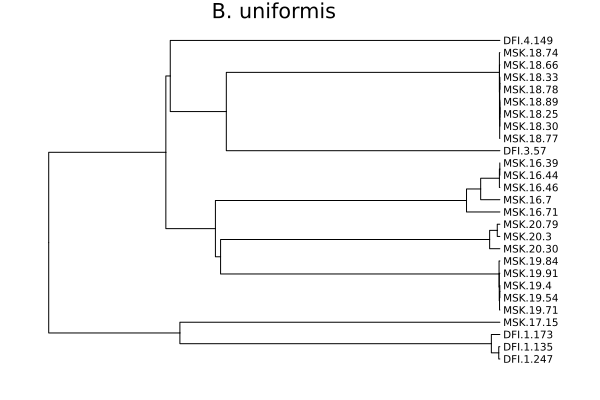

In [16]:
dendroplot = plot(uniformistree, 
    title="B. uniformis",
    fs=7, 
    rightmargin=2Plots.Measures.cm, )

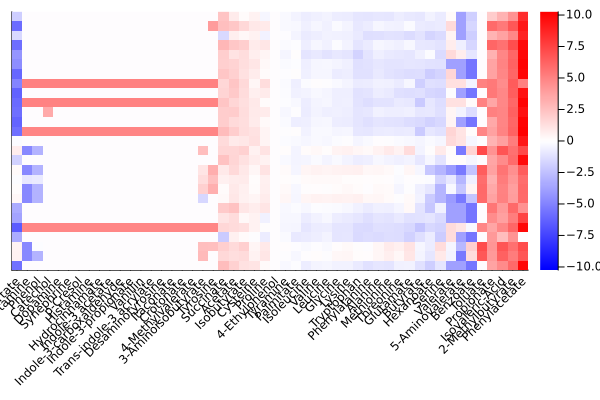

In [19]:
subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plotmtx = bb_met_lfc[mask, :][subtreeorder,:]
metabolitehc = hclust(pairwise(Euclidean(), plotmtx, dims=2), linkage=:average, branchorder=:optimal)
clims = extrema(plotmtx) |> x->abs.(x) |> maximum |> x->(-x, x)
colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]
expressionplot = heatmap(plotmtx[:, metabolitehc.order], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][subtreeorder]),
    xticks=(1:length(metabolitehc.order), replace.(biobank["metabolites_foldchange"].var_names.vals[metabolitehc.order], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=45,
    bottommargin=10Plots.Measures.mm,
    grid=false
    )

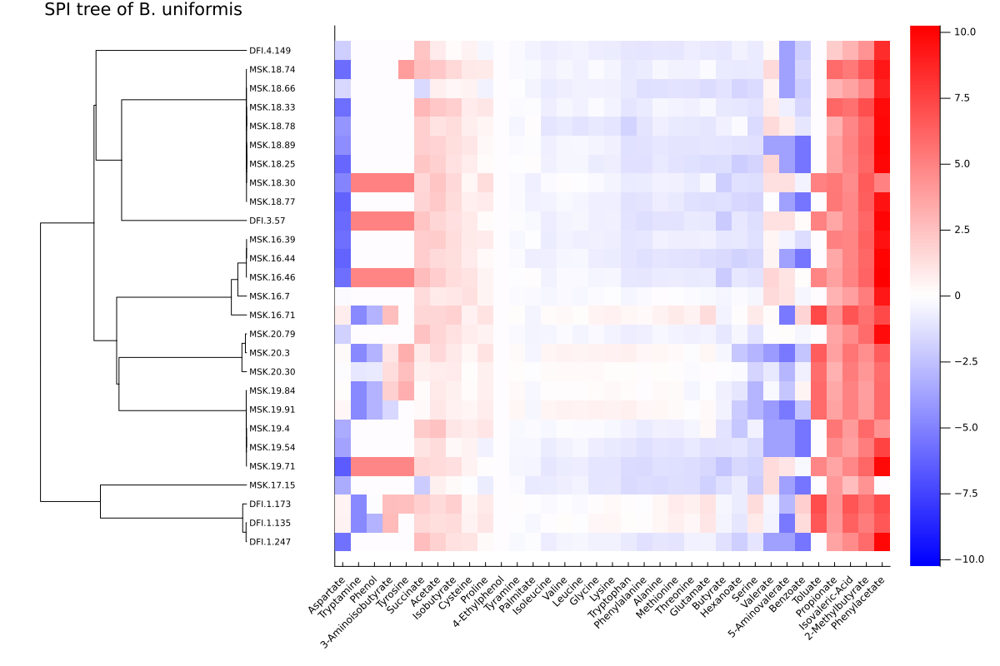

In [24]:
dendroplot = plot(uniformistree, 
    title="SPI tree of B. uniformis",
    fs=7, 
    rightmargin=2Plots.Measures.cm, )

subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plotmtx = bb_met_lfc[mask, :][subtreeorder,:]
metabolitehc = hclust(pairwise(Euclidean(), plotmtx, dims=2), linkage=:average, branchorder=:optimal)
clims = extrema(plotmtx) |> x->abs.(x) |> maximum |> x->(-x, x)
colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]

expressionplot = heatmap(plotmtx[:, colstouse], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][subtreeorder]),
    xticks=(1:length(colstouse), replace.(biobank["metabolites_foldchange"].var_names.vals[colstouse], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=45,
    bottommargin=10Plots.Measures.mm,
    grid=false
    )

layout = @layout [a{.25w} b]
plot(dendroplot, expressionplot, size=(1200, 800), link=:y, layout=layout)

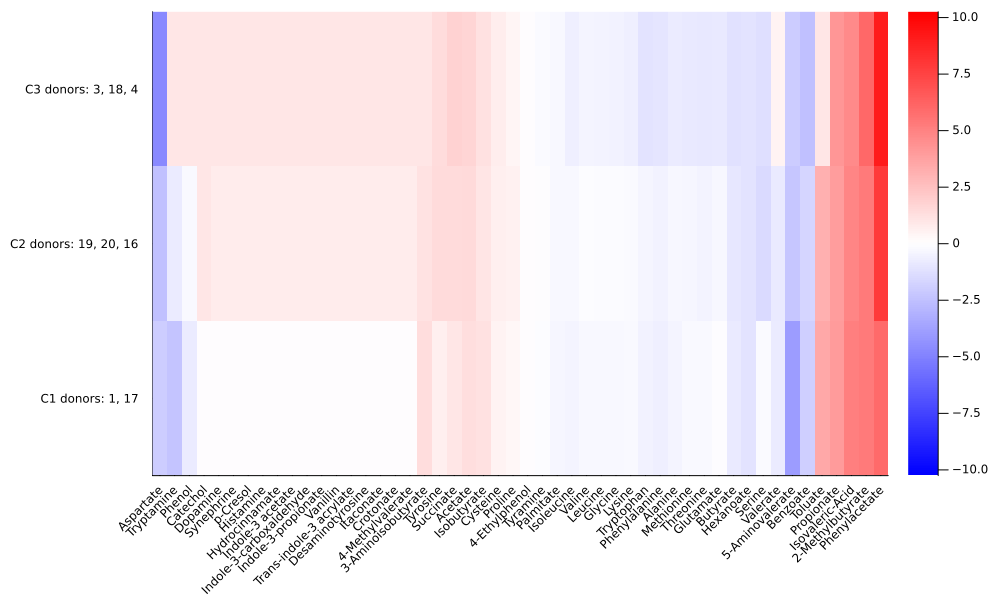

In [ ]:
c1 = mean(plotmtx[1:4, metabolitehc.order], dims=1)
c2 = mean(plotmtx[5:17, metabolitehc.order], dims=1)
c3 = mean(plotmtx[18:27, metabolitehc.order], dims=1)
heatmap(vcat(c1,c2,c3), 
    size=(1000, 600),
    c=:bwr, 
    clims=clims,
    yticks=(1:3, ["C1 donors: 1, 17", "C2 donors: 19, 20, 16", "C3 donors: 3, 18, 4"]),
    xticks=(1:size(bb_met_lfc, 2), replace.(biobank["metabolites_foldchange"].var_names.vals[metabolitehc.order], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=45,
    bottommargin=10Plots.Measures.mm,
    grid=false    
)

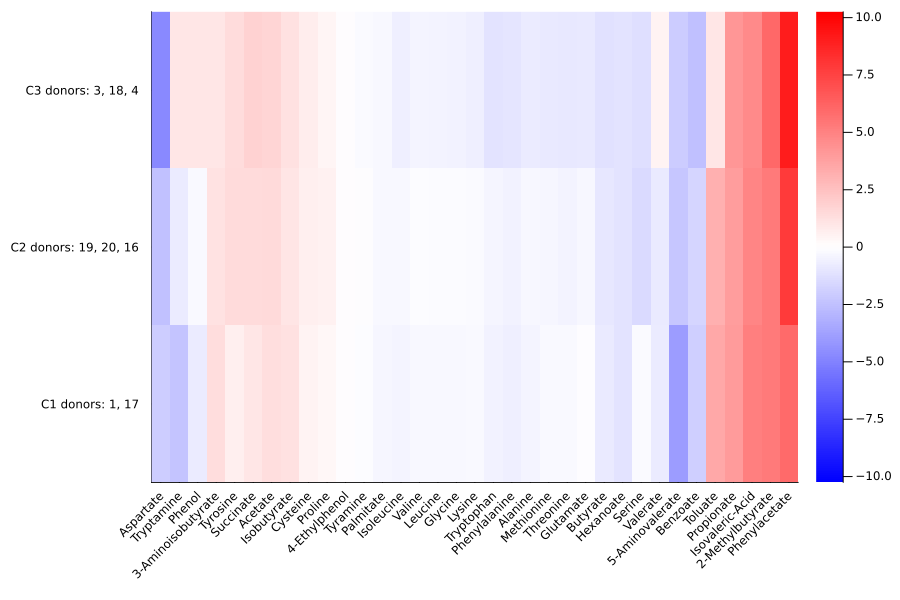

In [ ]:
c1 = mean(plotmtx[1:4, colstouse], dims=1)
c2 = mean(plotmtx[5:17, colstouse], dims=1)
c3 = mean(plotmtx[18:27, colstouse], dims=1)
heatmap(vcat(c1,c2,c3), 
    size=(900, 600),
    c=:bwr, 
    clims=clims,
    yticks=(1:3, ["C1 donors: 1, 17", "C2 donors: 19, 20, 16", "C3 donors: 3, 18, 4"]),
    xticks=(1:length(colstouse), replace.(biobank["metabolites_foldchange"].var_names.vals[colstouse], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=45,
    bottommargin=10Plots.Measures.mm,
    grid=false    
)

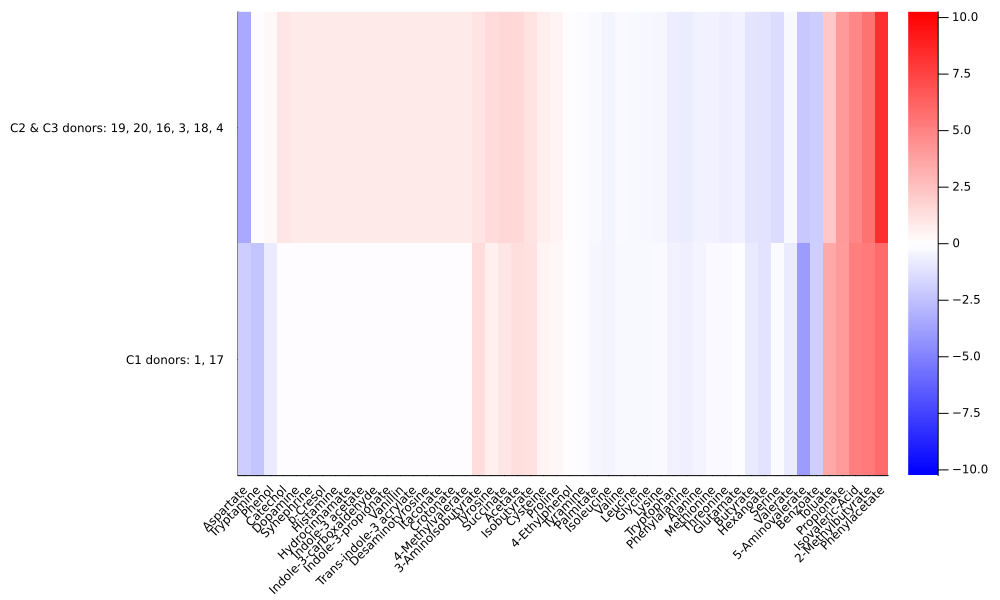

In [275]:
c1 = mean(plotmtx[1:4, metabolitehc.order], dims=1)
c2 = mean(plotmtx[5:27, metabolitehc.order], dims=1)
# c3 = mean(plotmtx[18:27, metabolitehc.order], dims=1)
heatmap(vcat(c1,c2), 
    size=(1000, 600),
    c=:bwr, 
    clims=clims,
    yticks=(1:2, ["C1 donors: 1, 17", "C2 & C3 donors: 19, 20, 16, 3, 18, 4"]),
    xticks=(1:length(metabolitehc.order), replace.(biobank["metabolites_foldchange"].var_names.vals[metabolitehc.order], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=45,
    bottommargin=10Plots.Measures.mm,
    grid=false    
)

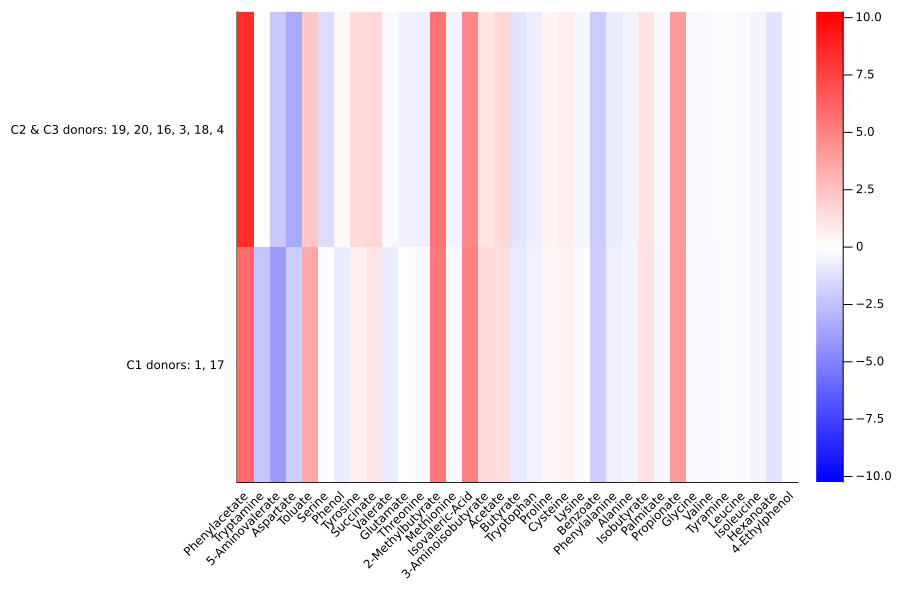

In [284]:
c1 = mean(plotmtx[1:4, colstouse], dims=1)
c2 = mean(plotmtx[5:27, colstouse], dims=1)
# c3 = mean(plotmtx[18:27, colstouse], dims=1)
colororder = sortperm(vec(abs.(c1 .- c2)), rev=true)
heatmap(vcat(c1,c2)[:, colororder], 
    size=(900, 600),
    c=:bwr, 
    clims=clims,
    yticks=(1:2, ["C1 donors: 1, 17", "C2 & C3 donors: 19, 20, 16, 3, 18, 4"]),
    xticks=(1:length(colororder), replace.(biobank["metabolites_foldchange"].var_names.vals[colstouse][colororder], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=45,
    bottommargin=10Plots.Measures.mm,
    grid=false    
)

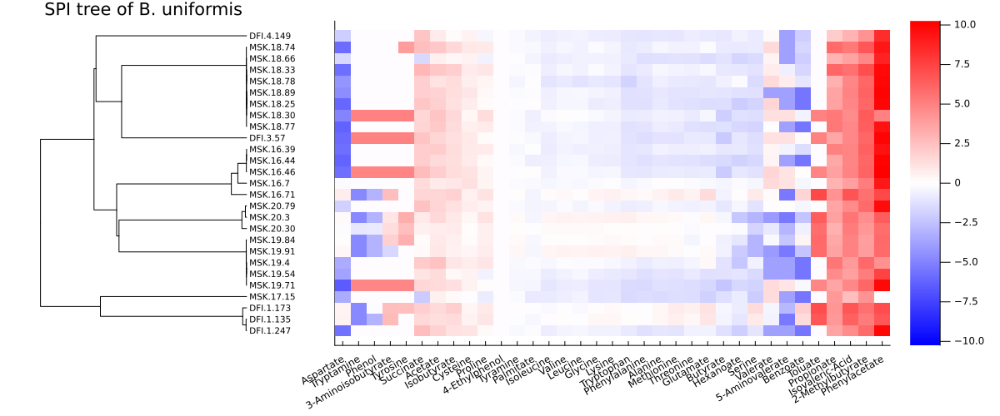

In [42]:
dendroplot = plot(uniformistree, 
    title="SPI tree of B. uniformis",
    fs=7, 
    rightmargin=2Plots.Measures.cm, )

subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plotmtx = bb_met_lfc[mask, :][subtreeorder,:]
metabolitehc = hclust(pairwise(Euclidean(), plotmtx, dims=2), linkage=:average, branchorder=:optimal)
clims = extrema(plotmtx) |> x->abs.(x) |> maximum |> x->(-x, x)
colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]

expressionplot = heatmap(plotmtx[:, colstouse], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][subtreeorder]),
    xticks=(1:length(colstouse), replace.(biobank["metabolites_foldchange"].var_names.vals[colstouse], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=30,
    bottommargin=10Plots.Measures.mm,
    grid=false
    )

layout = @layout [a{.25w} b]
plot(dendroplot, expressionplot, size=(1200, 500), link=:y, layout=layout)

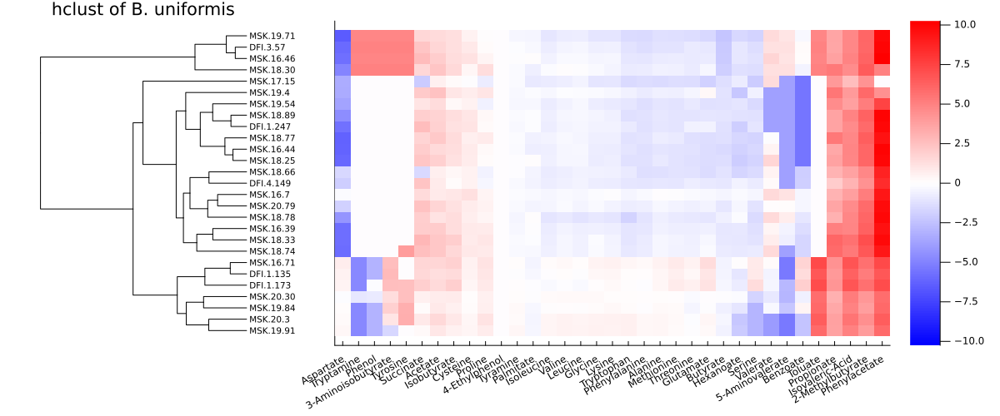

In [46]:
# subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plotmtx = bb_met_lfc[mask, :]

metabolitehc = hclust(pairwise(Euclidean(), plotmtx, dims=2), linkage=:average, branchorder=:optimal)
donorhc = hclust(pairwise(Euclidean(), plotmtx, dims=1), linkage=:average, branchorder=:optimal)
clims = extrema(plotmtx) |> x->abs.(x) |> maximum |> x->(-x, x)
colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]


plttree = readnw(SPI.nwstr(donorhc, tiplabels[mask]; labelinternalnodes=false))
hclustplot = plot(plttree, 
    title="hclust of B. uniformis",
    fs=7, 
    rightmargin=2Plots.Measures.cm, )

expressionheatmap = heatmap(plotmtx[donorhc.order, colstouse], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][donorhc.order]),
    xticks=(1:length(colstouse), replace.(biobank["metabolites_foldchange"].var_names.vals[colstouse], "_rel"=>"")),
    xtickfontsize=8,
    xrotation=30,
    bottommargin=10Plots.Measures.mm,
    grid=false
    )

layout = @layout [a{.25w} b]
plot(hclustplot, expressionheatmap, size=(1200, 500), link=:y, layout=layout)


## Significance testing

In [54]:
using HypothesisTests

In [145]:
specieswith20reps = metabolicallyvariabledf |>
    # df -> filter(:max_metabolicdistance => >=(15), df) |>
    df -> filter(:num_isolates => >=(20), df) |>
    df -> filter(:species => !=("unclassified"), df) |>
    # df -> filter(:species => !=("Blautia luti"), df) |>
    # df -> filter(:species => !=("Blautia wexlerae"), df) |>
    df -> sort(df, :num_isolates, rev=true)

Row,species,num_isolates,max_metabolicdistance,isvariable
,String,Int64,Float64,Bool
1,Phocaeicola vulgatus,88,25.5096,true
2,[Ruminococcus] gnavus,41,21.7553,true
3,Bacteroides thetaiotaomicron,35,11.8975,false
4,Anaerostipes hadrus,31,21.2165,true
5,Bacteroides uniformis,27,27.9053,true
6,Bifidobacterium breve,24,15.2342,false
7,Blautia luti,24,14.9265,false
8,Coprococcus comes,23,12.8208,false
9,Dorea formicigenerans,22,17.1766,false


In [146]:
bbobs_trn = biobank.obs[trn_mask,:];

In [147]:
spe20rep_mask = .!isnothing.(indexin(bbobs_trn.species, specieswith20reps.species));

In [148]:
subsetDij = spiDij[spe20rep_mask, spe20rep_mask];
subsettree_hc = hclust(subsetDij, linkage=:average, branchorder=:optimal)
subsettreestring = SPI.nwstr(subsettree_hc, bbobs_trn.ID[spe20rep_mask]; labelinternalnodes=false)
subsettree = readnw(subsettreestring);

In [149]:
pdir = plotsdir("metabolic_association") |> mkpath

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association"

In [150]:
plotlyjs()

Plots.PlotlyJSBackend()

In [161]:
pltmtx[256:258, 2]

3-element Vector{String}:
 "Dorea formicigenerans"
 "[Ruminococcus] gnavus"
 "Coprococcus comes"

In [154]:
vec(pltmtx)

712-element Vector{String}:
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 "Bacteroidetes"
 ⋮
 "Anaerostipes hadrus"
 "Anaerostipes hadrus"
 "Anaerostipes hadrus"
 "Anaerostipes hadrus"
 "Anaerostipes hadrus"
 "Anaerostipes hadrus"
 "Anaerostipes hadrus"
 "Blautia luti"
 "Blautia luti"

In [203]:
targetedrelativecols = [ 
    "2-Methylbutyrate_rel", "3-Aminoisobutyrate_rel", "4-Methylvalerate_rel", "5-Aminovalerate_rel",
    "Acetate_rel", "Alanine_rel", "Aspartate_rel", "Benzoate_rel", "Butyrate_rel", "Catechol_rel", "Crotonate_rel",
    "Cysteine_rel", "Desaminotyrosine_rel", "Glutamate_rel", "Glycine_rel", "Hexanoate_rel", "Isobutyrate_rel", "Isoleucine_rel",
    "Isovaleric-Acid_rel", "Leucine_rel", "Lysine_rel", "Methionine_rel", "p-Cresol_rel", "Palmitate_rel",
    "Phenol_rel", "Phenylacetate_rel", "Phenylalanine_rel", "Proline_rel", "Propionate_rel", "Serine_rel",
    "Succinate_rel", "Threonine_rel", "Tryptamine_rel", "Tryptophan_rel", "Tyramine_rel", "Tyrosine_rel", "Valerate_rel", "Valine_rel",
];
metabolite_mask = indexin(targetedrelativecols, biobank["metabolites_foldchange"].var_names);
metabolite_38_names = replace.(biobank["metabolites_foldchange"].var_names.vals[metabolite_mask], "_rel"=>"");

38-element Vector{String}:
 "2-Methylbutyrate_rel"
 "3-Aminoisobutyrate_rel"
 "4-Methylvalerate_rel"
 "5-Aminovalerate_rel"
 "Acetate_rel"
 "Alanine_rel"
 "Aspartate_rel"
 "Benzoate_rel"
 "Butyrate_rel"
 "Catechol_rel"
 ⋮
 "Serine_rel"
 "Succinate_rel"
 "Threonine_rel"
 "Tryptamine_rel"
 "Tryptophan_rel"
 "Tyramine_rel"
 "Tyrosine_rel"
 "Valerate_rel"
 "Valine_rel"

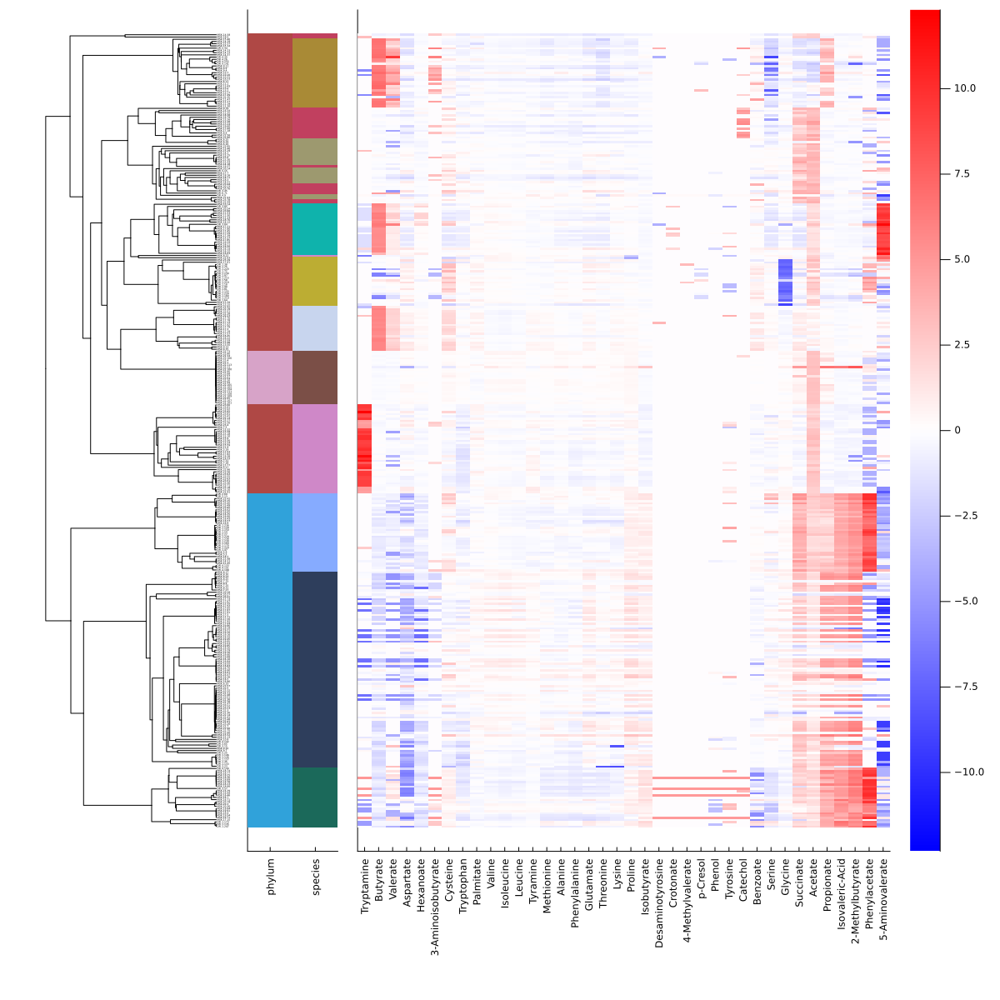

In [511]:
p1 = plot(subsettree, size=(1000, 1200), fs=2, rightmargin=3Plots.Measures.mm, label="",)

pltmtx = Matrix(bbobs_trn[spe20rep_mask, [:phylum, :species]][subsettree_hc.order, :])

p2 = heatmap(pltmtx, 
    c=:glasbey_hv_n256,
    yticks=:none, #(1:length(bbobs_trn.ID[spe20rep_mask]), bbobs_trn.ID[spe20rep_mask]),
    ytickfontsize=4,
    xticks=(1:3, string.([:phylum, :species])),
    xrotation=90,
    colorbar=false,
    axis=:none,
    grid=false,
    # framestyle=:none,
)

# subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plt_metab_mtx = bb_met_lfc[spe20rep_mask, metabolite_mask]

metabolitehc = hclust(pairwise(Euclidean(), plt_metab_mtx, dims=2), linkage=:average, branchorder=:optimal)
clims = extrema(plt_metab_mtx) |> x->abs.(x) |> maximum |> x->(-x, x)
# colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]

p3 = heatmap(plt_metab_mtx[subsettree_hc.order, metabolitehc.order], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][donorhc.order]),
    xticks=(1:length(metabolitehc.order), metabolite_38_names[metabolitehc.order]),
    xtickfontsize=8,
    xrotation=90,
    bottommargin=10Plots.Measures.mm,
    grid=false
) 

layout = @layout [a{.2w} b{.1w} c]
plot(p1, p2, p3, size=(1200, 1200), link=:y, layout=layout)

In [512]:
savefig(joinpath(pdir, "full_subset_spitree_with_aligned_metabolite.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/full_subset_spitree_with_aligned_metabolite.pdf"

## Significance testing of metabolites

In [172]:
using HypothesisTests
using MultipleTesting

In [254]:
targetedrelativecols = [ 
    "2-Methylbutyrate_rel", "3-Aminoisobutyrate_rel", "4-Methylvalerate_rel", "5-Aminovalerate_rel",
    "Acetate_rel", "Alanine_rel", "Aspartate_rel", "Benzoate_rel", "Butyrate_rel", "Catechol_rel", "Crotonate_rel",
    "Cysteine_rel", "Desaminotyrosine_rel", "Glutamate_rel", "Glycine_rel", "Hexanoate_rel", "Isobutyrate_rel", "Isoleucine_rel",
    "Isovaleric-Acid_rel", "Leucine_rel", "Lysine_rel", "Methionine_rel", "p-Cresol_rel", "Palmitate_rel",
    "Phenol_rel", "Phenylacetate_rel", "Phenylalanine_rel", "Proline_rel", "Propionate_rel", "Serine_rel",
    "Succinate_rel", "Threonine_rel", "Tryptamine_rel", "Tryptophan_rel", "Tyramine_rel", "Tyrosine_rel", "Valerate_rel", "Valine_rel",
];
metabolite_mask = indexin(targetedrelativecols, biobank["metabolites_foldchange"].var_names);
metabolite_38_names = replace.(biobank["metabolites_foldchange"].var_names.vals[metabolite_mask], "_rel"=>"");

In [209]:
spe20rep_mask = .!isnothing.(indexin(bbobs_trn.species, specieswith20reps.species));
metab_mtx = bb_met_lfc[spe20rep_mask, metabolite_mask];

In [215]:
isolate_ids = bbobs_trn.ID[spe20rep_mask];

In [521]:
testresults = []
for node in prewalk(subsettree)
    (isleaf(node) || any(isleaf.(node.children))) && continue
    grp1_idx = indexin(getleafnames(node.children[1]), isolate_ids)
    grp2_idx = indexin(getleafnames(node.children[2]), isolate_ids)
    pvals = mapslices(metab_mtx, dims=1) do column
        pvalue(MannWhitneyUTest(column[grp1_idx], column[grp2_idx]))
    end
    effects = mapslices(metab_mtx, dims=1) do column
        abs(mean(column[grp1_idx]) - mean(column[grp2_idx]) / std(column))
    end
    height_of_node = NewickTree.height(node)
    # grp1 = metab_mtx[grp1_idx, :]
    # grp2 = metab_mtx[grp2_idx, :]
    # pvals = map(axes(grp1, 2)) do i
    #     pvalue(MannWhitneyUTest(grp1[:, i], grp2[:, i]))
    # end
    push!(testresults, (height_of_node, effects, pvals))
end
testresults;

In [522]:
nodeheights = first.(testresults)
alleffects = reduce(vcat, getindex.(testresults, 2))
allpvals = reduce(vcat, last.(testresults))
allpvals_adj = allpvals |>
    vec |>
    x -> adjust(x, Bonferroni()) |>
    x -> reshape(x, size(allpvals)...);

In [546]:
sigresmtx = map(findall(allpvals_adj .<= 0.05)) do idx
    [idx[1] idx[2] alleffects[idx[1], idx[2]] metabolite_38_names[idx[2]] allpvals[idx[1], idx[2]] allpvals_adj[idx[1], idx[2]] nodeheights[idx[1]]]
end |> x->reduce(vcat, x)
sigresdf = DataFrame(sigresmtx, ["node_id", "metabolite_id", "effect_size_abs", "metabolite_name", "pval", "pval_adj", "node_height"])
sigresdf.node_id = Int64.(sigresdf.node_id)
sigresdf.metabolite_id = Int64.(sigresdf.metabolite_id)
sigresdf.node_height = Float64.(sigresdf.node_height)
sigresdf.effect_size_abs = Float64.(sigresdf.effect_size_abs)
sigresdf.pval = Float64.(sigresdf.pval)
sigresdf.pval_adj = Float64.(sigresdf.pval_adj)
sigresdf.metabolite_name = string.(sigresdf.metabolite_name)
sigresdf[!, "node_depth"] .= maximum(sigresdf.node_height) .- sigresdf.node_height
sigresdf;

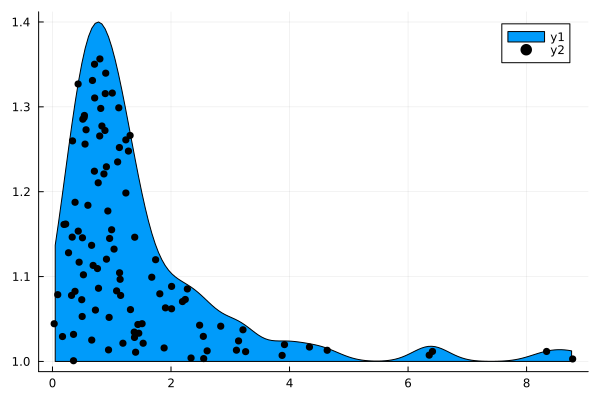

In [537]:
violin([1], sigresdf.effect_size_abs, side=:right, permute=(:x, :y))
dotplot!([1], sigresdf.effect_size_abs, side=:right, permute=(:x, :y), c=:black)

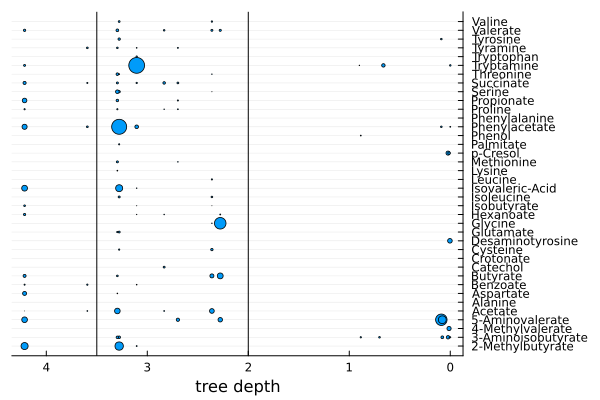

In [607]:
@df sigresdf scatter(:node_depth, :metabolite_id,
    markersize=:effect_size_abs,
    label="",
    ymirror=true,
    yticks=(1:38, metabolite_38_names),
    xgrid=false,
    xflip=true,
    xlabel="tree depth",
)
vline!([3.5, 2], c=:black, label="")

In [608]:
savefig(joinpath(pdir, "bubbleplot_of_significant_metabolites_by_treedepth.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/bubbleplot_of_significant_metabolites_by_treedepth.pdf"

In [ ]:
p4 = @df sigresdf scatter(:effect_size, :metabolite_id, 
    label="",
    ymirror=true,
    yticks=(1:38, metabolite_38_names),
    xgrid=false,
    )

In [556]:
sigresdf = sigresdf |> 
    df->groupby(df, :metabolite_name) |>
    df->DataFrames.transform(df, [:effect_size_abs, :node_depth]=>((x,y)->y[argmax(x)]) => :node_depth_maxeffect)

Row,node_id,metabolite_id,effect_size_abs,metabolite_name,pval,pval_adj,node_height,node_depth,node_depth_maxeffect
,Int64,Int64,Float64,String,Float64,Float64,Float64,Float64,Float64
1,1,1,3.91478,2-Methylbutyrate,1.18454e-32,4.32121e-29,0.0,4.21503,3.27848
2,3,1,4.63572,2-Methylbutyrate,7.5695e-6,0.0276135,0.936555,3.27848,3.27848
3,44,1,0.549616,2-Methylbutyrate,1.24707e-5,0.045493,1.10991,3.10513,3.27848
4,3,2,1.45583,3-Aminoisobutyrate,3.53131e-6,0.0128822,0.936555,3.27848,0.0220528
5,20,2,0.66031,3-Aminoisobutyrate,0.0,0.0,4.21503,0.0,0.0220528
6,43,2,1.37975,3-Aminoisobutyrate,1.07789e-8,3.93213e-5,0.918731,3.2963,0.0220528
7,53,2,1.53012,3-Aminoisobutyrate,0.0,0.0,4.13622,0.0788081,0.0220528
8,74,2,1.88389,3-Aminoisobutyrate,0.0,0.0,4.19298,0.0220528,0.0220528
9,75,2,0.222829,3-Aminoisobutyrate,0.0,0.0,4.20298,0.0120499,0.0220528


In [606]:
CSV.write(joinpath(ddir, "significant_metabolites_in_subsetSPItree_numisolatesperspecies=+20.csv"), sigresdf)

"/Users/ben/projects/Doran_etal_2022/data/exp_pro/BB728/significant_metabolites_in_subsetSPItree_numisolatesperspecies=+20.csv"

In [564]:
earlytreesigmetabolitesdf = filter(:node_depth_maxeffect => >(3.5), sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)

Row,metabolite_name,effect_size_abs_maximum
,String,Float64
1,Propionate,2.54539
2,Aspartate,2.19383
3,Succinate,1.74038
4,Hexanoate,1.23793
5,Tyramine,0.964163
6,Isobutyrate,0.945755
7,Benzoate,0.771797
8,Proline,0.724792


In [565]:
middletreesigmetabolitesdf = filter(:node_depth_maxeffect => (x)-> 2 .< x .< 3.5, sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)

Row,metabolite_name,effect_size_abs_maximum
,String,Float64
1,Tryptamine,8.77697
2,Phenylacetate,8.33743
3,Glycine,6.41192
4,2-Methylbutyrate,4.63572
5,Isovaleric-Acid,3.87506
6,Butyrate,3.25914
7,Acetate,3.10414
8,Serine,2.0101
9,Valerate,1.51202


In [566]:
latetreesigmetabolitesdf = filter(:node_depth_maxeffect => <(2), sigresdf) |>
    df -> groupby(df, :metabolite_name) |>
    df -> combine(df, :effect_size_abs => maximum) |>
    df -> sort(df, :effect_size_abs_maximum, rev=true)

Row,metabolite_name,effect_size_abs_maximum
,String,Float64
1,5-Aminovalerate,6.35702
2,Desaminotyrosine,2.55153
3,4-Methylvalerate,2.33822
4,p-Cresol,2.27602
5,3-Aminoisobutyrate,1.88389
6,Phenol,0.52227


In [324]:
sigresdf |>
    df->groupby(df, :metabolite_name) |>
    df->combine(df, :node_height => minimum) |>
    df->filter(:node_height_minimum => >(3.16), df)

Row,metabolite_name,node_height_minimum
,String,Float64
1,4-Methylvalerate,4.20298
2,Desaminotyrosine,4.21165
3,p-Cresol,4.19298
4,Phenol,3.32901


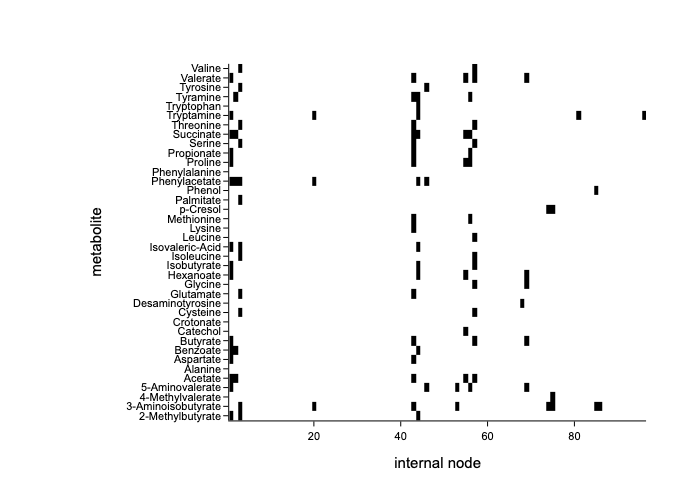

In [248]:
heatmap(permutedims(allpvals_adj .<= 0.05),
    ylabel="metabolite",
    xlabel="internal node",
    yticks = (1:38, replace.(metabolite_38_names, "_rel"=>"")),
    # xrotation=90,
    c=palette([:white, :black]),
    colorbar=false,
    tickdirection=:out,
    grid=false,
)

In [571]:
orderedemetabolites_names = vcat(
    earlytreesigmetabolitesdf.metabolite_name,
    middletreesigmetabolitesdf.metabolite_name,
    latetreesigmetabolitesdf.metabolite_name,
);

In [572]:
metabolite_mask_ord = indexin(orderedemetabolites_names, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));

In [591]:
clims

(-12.30585370299534, 12.30585370299534)

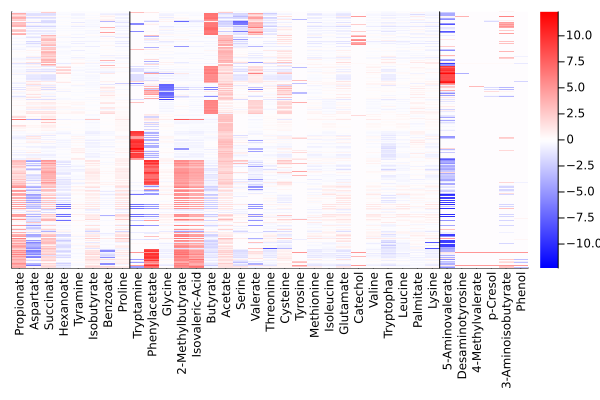

In [593]:
# subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plt_metab_mtx = bb_met_lfc[spe20rep_mask, metabolite_mask_ord]

# metabolitehc = hclust(pairwise(Euclidean(), plt_metab_mtx, dims=2), linkage=:average, branchorder=:optimal)
clims = extrema(plt_metab_mtx) |> x->abs.(x) |> maximum |> x->(-x, x)
# colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]

 heatmap(plt_metab_mtx[subsettree_hc.order, :], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][donorhc.order]),
    xticks=(1:length(orderedemetabolites_names), orderedemetabolites_names),
    xtickfontsize=8,
    xrotation=90,
    bottommargin=10Plots.Measures.mm,
    grid=false
)
sigmetab_plot = vline!([8.5, 8+21+.5], c=:black, label="")

In [594]:
savefig(joinpath(pdir, "all35_sig_metabolites_alignedtoSPItree.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/all35_sig_metabolites_alignedtoSPItree.pdf"

In [595]:
orderedemetabolites_names = vcat(
    earlytreesigmetabolitesdf.metabolite_name[1:5],
    middletreesigmetabolitesdf.metabolite_name[1:10],
    latetreesigmetabolitesdf.metabolite_name[1:5],
);
metabolite_mask_ord = indexin(orderedemetabolites_names, replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""));

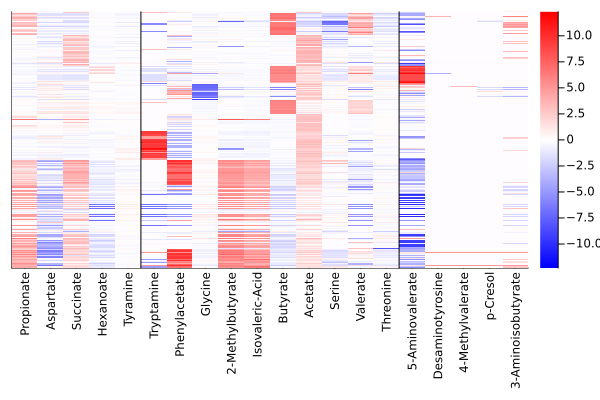

In [599]:
# subtreeorder = indexin(name.(getleaves(uniformistree)), tiplabels[mask])
plt_metab_mtx = bb_met_lfc[spe20rep_mask, metabolite_mask_ord]

# metabolitehc = hclust(pairwise(Euclidean(), plt_metab_mtx, dims=2), linkage=:average, branchorder=:optimal)
clims = extrema(plt_metab_mtx) |> x->abs.(x) |> maximum |> x->(-x, x)
# colstouse = metabolitehc.order[vcat(collect.([1:3,19:50])...)]

 heatmap(plt_metab_mtx[subsettree_hc.order, :], 
    c=:bwr,
    clims=clims,
    yticks=:none, #(1:sum(mask), tiplabels[mask][donorhc.order]),
    xticks=(1:length(orderedemetabolites_names), orderedemetabolites_names),
    xtickfontsize=8,
    xrotation=90,
    bottommargin=10Plots.Measures.mm,
    grid=false
)
sigmetab_filt_plot = vline!([5.5, 15.5], c=:black, label="")

In [600]:
savefig(joinpath(pdir, "filtered_top20_sig_metabolites_alignedtoSPItree.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/filtered_top20_sig_metabolites_alignedtoSPItree.pdf"

## Plot subset tree fancy

In [468]:
subsettree;

In [469]:
# define a function that returns a Plots.Shape
rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])

rectangle (generic function with 1 method)

In [470]:
speciesvector = bbobs_trn.species[spe20rep_mask][subsettree_hc.order]
length(unique(speciesvector))

11

In [471]:
length(speciesvector)

356

In [472]:
(speciesvector .== "Bacteroides uniformis") |> sum

27

In [476]:
breaks = findall(speciesvector[begin:(end-1)] .!= speciesvector[2:end])[Not([10, 11, 12, 13, 14,15])]
edges = [(s, e) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];
rects = [rectangle(2,(e-s),0,s+.5) for (s,e) in zip(vcat([0],breaks), vcat(breaks, [length(speciesvector)]))];
# flip order of bifido and R. gnavus
# rects = rects[[1,2,3,5,4,6,7,8,9,10,11,12]]


12-element Vector{Shape{Int64, Float64}}:
 Shape{Int64, Float64}([0, 2, 2, 0], [0.5, 0.5, 27.5, 27.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [27.5, 27.5, 115.5, 115.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [115.5, 115.5, 150.5, 150.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [150.5, 150.5, 190.5, 190.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [190.5, 190.5, 214.5, 214.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [214.5, 214.5, 234.5, 234.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [234.5, 234.5, 256.5, 256.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [256.5, 256.5, 257.5, 257.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [257.5, 257.5, 280.5, 280.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [280.5, 280.5, 323.5, 323.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [323.5, 323.5, 354.5, 354.5])
 Shape{Int64, Float64}([0, 2, 2, 0], [354.5, 354.5, 356.5, 356.5])

In [490]:
using Random: shuffle

In [507]:
# wsave(joinpath(ddir, "subsettreecolors.jld2"), Dict("colors"=>colors))
colors = wload(joinpath(ddir, "subsettreecolors.jld2"))["colors"]

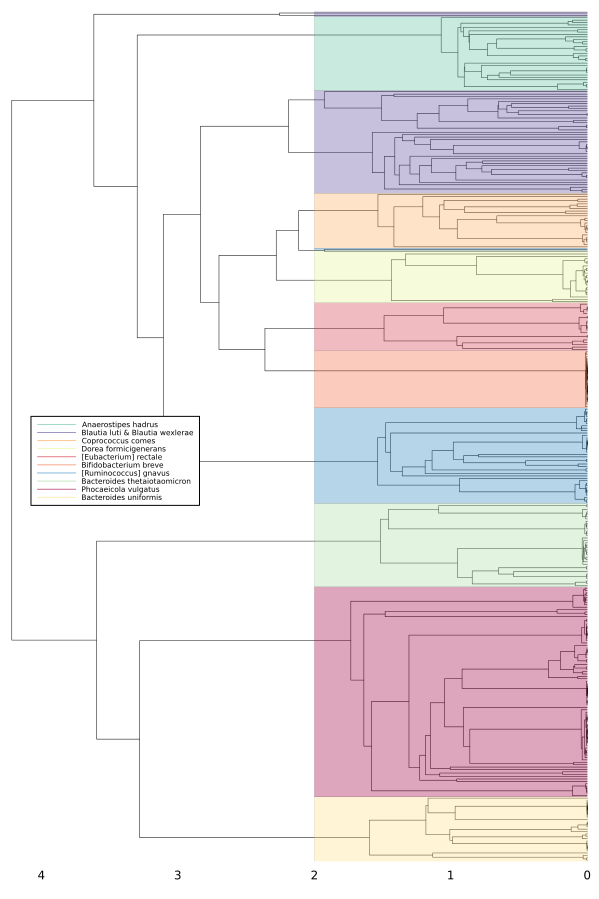

In [588]:
# colors = shuffle(permutedims(palette(:Spectral_10, 10).colors.colors))

plot(subsettree_hc, 
    size=(600, 900),
    lw=.5,
    yflip=true, 
    xmirror=true,
    xticks=:none,
    permute=(:y, :x),
    grid=false,
    tickdirection=:none,
    rightmargin=1Plots.Measures.mm, 
    label="",
    framestyle=:grid,
)
plot!(permutedims(rects[Not(8, 12)]), fill=0.35, lw=0, c=colors, label="")
plot!(rects[8], fill=0.35, lw=0, c=colors[4], label="")
plot!(rects[12], fill=0.35, lw=0, c=colors[9], label="")
specieslabels= [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
fancy_treeplot = plot!(zeros(1, 10), 
    legend=:left,
    labels=permutedims(reverse(specieslabels)), 
    c=reverse(colors),
    legendfontsize=5,
)


In [589]:
savefig(joinpath(pdir, "panelA_spitree_subsettospecieswith20plusisolates.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/panelA_spitree_subsettospecieswith20plusisolates.pdf"

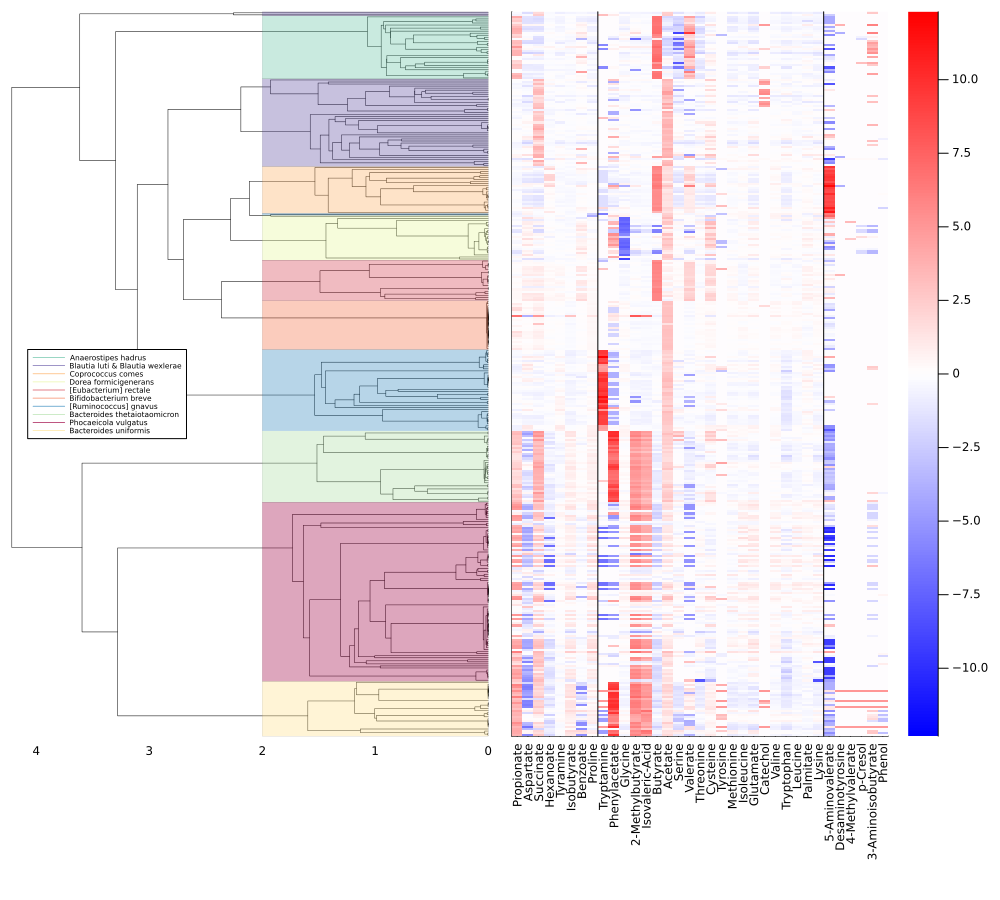

In [601]:
plot(fancy_treeplot, sigmetab_plot, size=(1000, 900))

In [602]:
savefig(joinpath(pdir, "all35_sigmetabolites_matchedtoSPItree.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/all35_sigmetabolites_matchedtoSPItree.pdf"

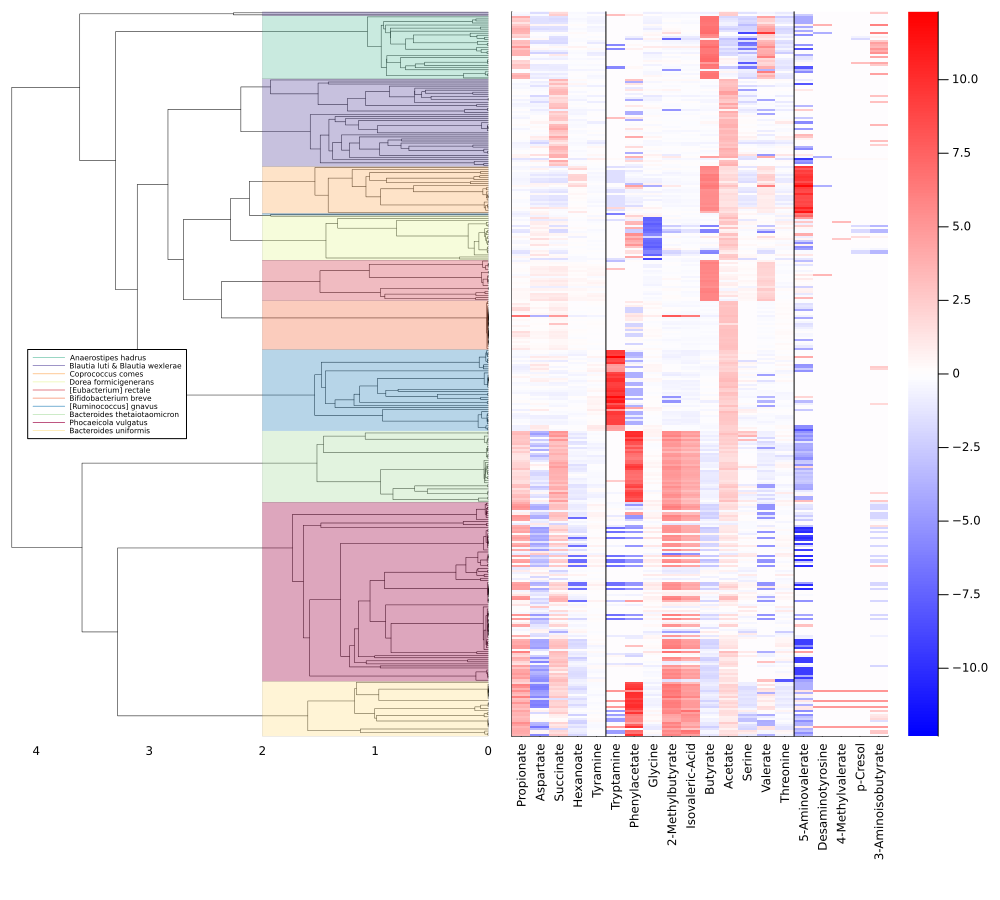

In [604]:
plot(fancy_treeplot, sigmetab_filt_plot, size=(1000, 900))

In [605]:
savefig(joinpath(pdir, "filteredtotop20_sigmetabolites_matchedtoSPItree.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/metabolic_association/filteredtotop20_sigmetabolites_matchedtoSPItree.pdf"

## Test lasso of LSVs

In [ ]:
using MLJ
@load LogisticClassifier pkg=MLJLinearModels
@load MultinomialClassifier pkg=MLJLinearModels

┌ Info: For silent loading, specify `verbosity=0`. 
└ @ Main /Users/ben/.julia/packages/MLJModels/8Nrhi/src/loading.jl:159


import MLJLinearModels ✔


import MLJLinearModels ✔


┌ Info: For silent loading, specify `verbosity=0`. 
└ @ Main /Users/ben/.julia/packages/MLJModels/8Nrhi/src/loading.jl:159


MLJLinearModels.MultinomialClassifier